In [1]:
import os 
import numpy as np
import pandas as pd

from sklearn.metrics.cluster import normalized_mutual_info_score
from sklearn.metrics.cluster import adjusted_rand_score

In [2]:
import seaborn as sns
# import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.font_manager # to solve: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.

import scanpy as sc

In [3]:
import sys
sys.path.append('../../')

import utils

In [4]:
from downstream.multisection import compute_lisi

In [5]:
# cols = ['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6','#6a3d9a','#ffd92f','#b15928']
# cols = ['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#6a3d9a','#ff7f00','#cab2d6','#fdbf6f','#ffd92f','#b15928']
cols = ['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#6a3d9a','#ff7f00','#cab2d6','#e78ac3','#ffd92f','#b15928']
sns.color_palette(cols)

[(0.6509803921568628, 0.807843137254902, 0.8901960784313725),
 (0.12156862745098039, 0.47058823529411764, 0.7058823529411765),
 (0.6980392156862745, 0.8745098039215686, 0.5411764705882353),
 (0.2, 0.6274509803921569, 0.17254901960784313),
 (0.984313725490196, 0.6039215686274509, 0.6),
 (0.8901960784313725, 0.10196078431372549, 0.10980392156862745),
 (0.41568627450980394, 0.23921568627450981, 0.6039215686274509),
 (1.0, 0.4980392156862745, 0.0),
 (0.792156862745098, 0.6980392156862745, 0.8392156862745098),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (1.0, 0.8509803921568627, 0.1843137254901961),
 (0.6941176470588235, 0.34901960784313724, 0.1568627450980392)]

In [6]:
# cols = utils.react_cols_10
# cols.extend(['#fb9a99','#ffd92f'])
# sns.color_palette(cols)

# Config

In [8]:
# set global rc parameters
sc.settings.set_figure_params(vector_friendly=True)

utils.config_rc(dpi=300, font_size=6)
# mpl.rcParams
wk_root = os.path.abspath(os.path.join(os.getcwd(), os.pardir, os.pardir))

In [9]:
# multisection data result root path
data_root = utils.get_path('multisection_wk_root_path', json_path=os.path.join(wk_root, '_data.json'))

# Mouse Olfa

In [10]:
_data_path =  os.path.join(data_root,"mouse_olfactory/")

In [10]:
# all methods ressults
_results = os.path.join(_data_path,'merge_all.h5ad')

In [11]:
adata = sc.read_h5ad(_results)

In [12]:
adata

AnnData object with n_obs × n_vars = 201740 × 23669
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'array_row', 'array_col', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'batch', 'SpaSEG_discrete_clusters', 'SpaSEG_clusters', 'ground_truth_code', 'SpaSEG_batch_clusters', 'X_pca_leiden_0.5', 'X_Harmony_leiden_0.5', 'H_liger_leiden_0.5', 'X_pca_leiden_0.6', 'X_Harmony_leiden_0.6', 'H_liger_leiden_0.6', 'X_pca_leiden_0.7', 'X_Harmony_leiden_0.7', 'H_liger_leiden_0.7', 'X_pca_leiden_0.8', 'X_Harmony_leiden_0.8', 'H_liger_leiden_0.8', 'X_pca_leiden_0.9', 'X_Harmony_leiden_0.9', 'H_liger_leiden_0.9', 'X_Harmony_leiden_0.51', 'H_liger_leiden_0.51', 'X_Harmony_leiden_0.52', 'H_liger_leiden_0.52', 'X_Harmony_leiden_0.53', 'H_liger_leiden_0.53', 'X_Harmony_leiden_0.54', 'H_liger_leiden_0

In [13]:
ground_labels = adata.obs['annotation'].cat.categories
_len_gl = len(ground_labels)
ground_col_palette = dict(zip(ground_labels, cols[:_len_gl]))

In [14]:
sample_ids = ['Mouse_olfa_S1', 'Mouse_olfa_S2']
sample_title = ['Mouse Olfa S1', 'Mouse Olfa S2']
n_sample = len(sample_ids)

In [15]:
sample_ids

['Mouse_olfa_S1', 'Mouse_olfa_S2']

# Plot Ground Truth

In [16]:
sc.settings._vector_friendly

True

/home/baiyong/.local/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/baiyong/.local/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


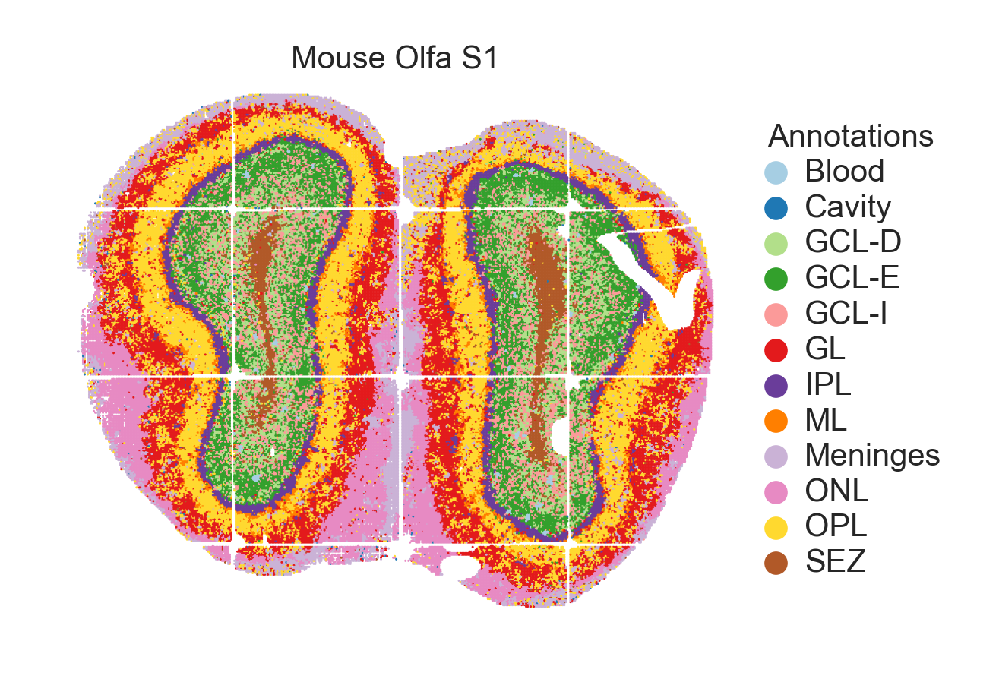

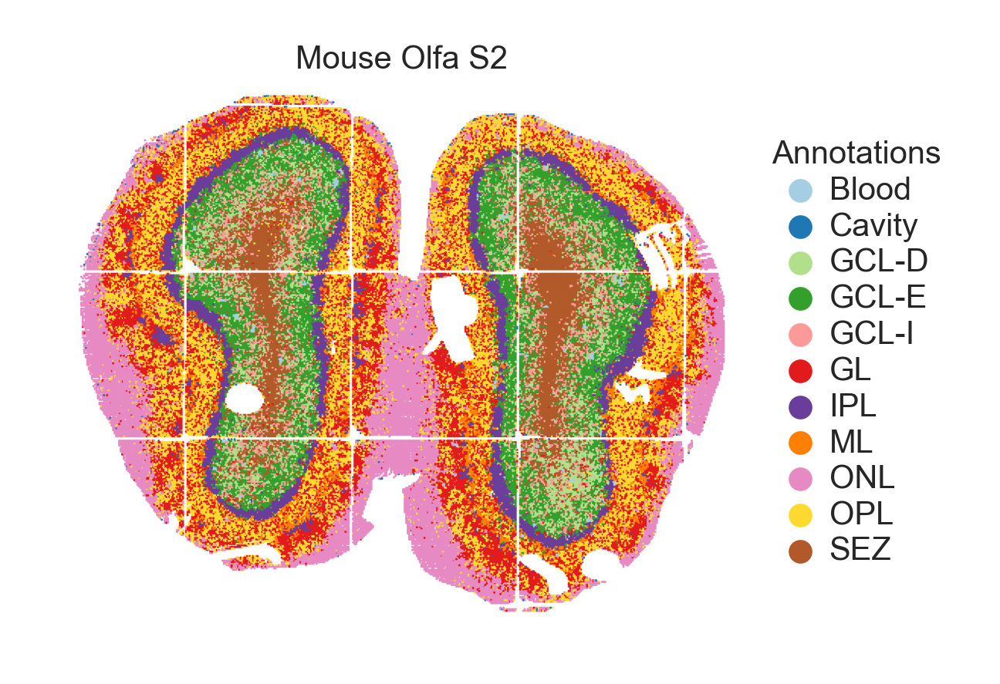

In [23]:
for i, _sample_id in enumerate(sample_ids):
    _adata = adata[adata.obs['batch']==_sample_id]
    fig,ax = plt.subplots(figsize=(utils.centimeter*5, utils.centimeter*5))
    sc.pl.spatial(_adata, color="annotation", show=False, ax=ax, spot_size =1.5, img_key=None, frameon=False,palette=ground_col_palette, alpha=1)
    ax.set_title('{0}'.format(sample_title[i]),pad=0, y=1)
    
    leg = ax.legend(loc='center left', bbox_to_anchor=[0.98, 0.5], ncol=1, frameon=False, 
           markerscale=0.6, labelspacing=0.2, fontsize=5,
          handleheight= 0.8, handlelength=1,title='Annotations')
    leg.get_title().set_fontsize('5')
    plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/{_sample_id}_ground_truth.pdf"), bbox_inches='tight', format='pdf', dpi=300)

# SpaSEG

In [18]:
spaseg_labels = adata.obs['SpaSEG_clusters'].cat.categories
_len_ss_lab = len(spaseg_labels)
ss_col_palette = dict(zip(spaseg_labels, cols[:_len_ss_lab]))

/home/baiyong/.local/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/baiyong/.local/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


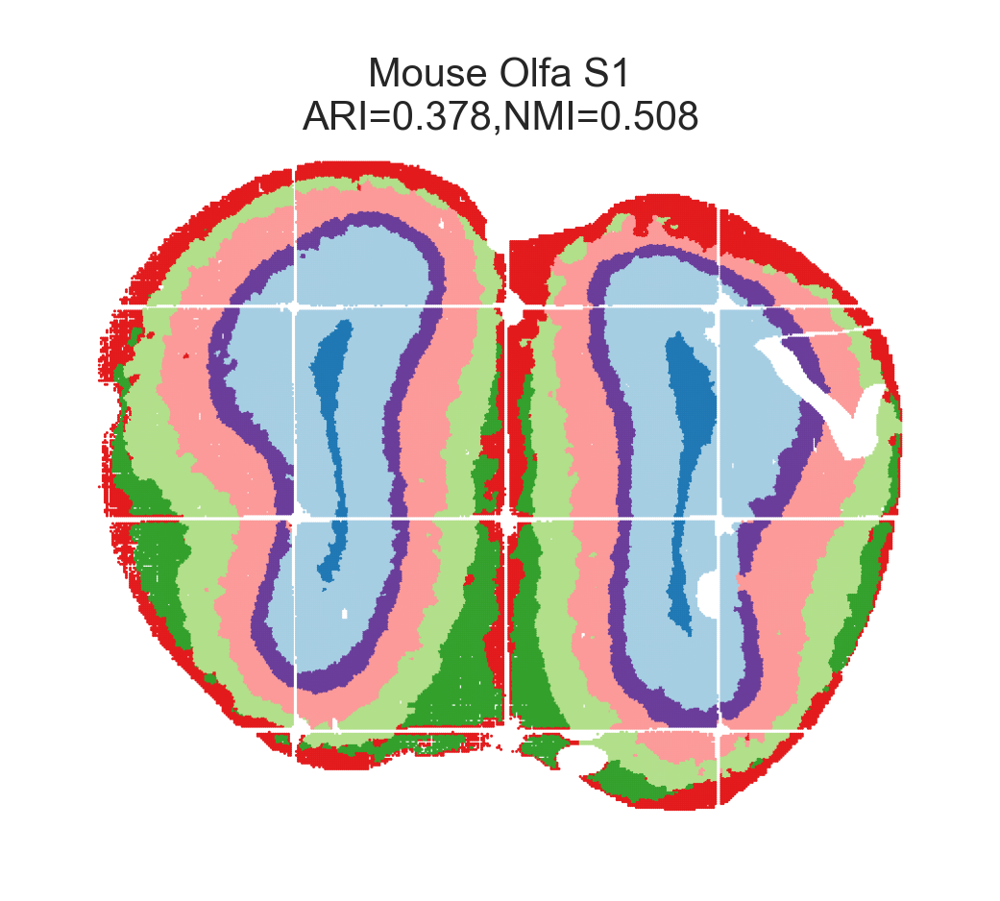

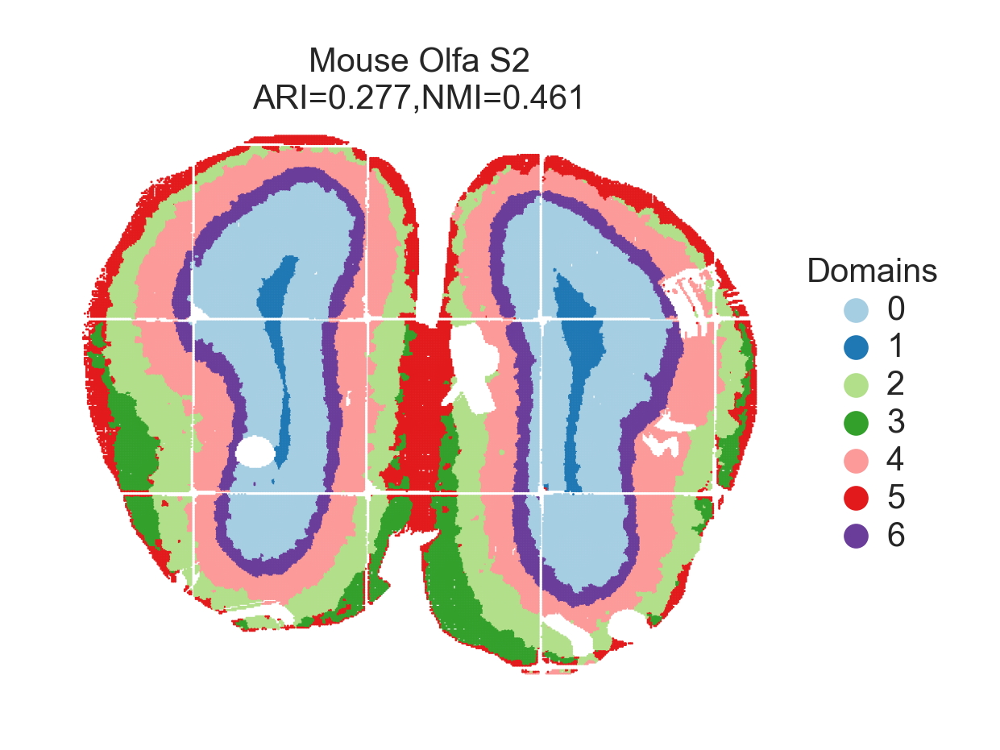

In [25]:
for i, _sample_id in enumerate(sample_ids):
    _adata = adata[adata.obs['batch']==_sample_id]
    ground_truth = _adata.obs['annotation'].cat.codes.values
    spaseg_clusters = _adata.obs['SpaSEG_clusters'].values
    ari = adjusted_rand_score(ground_truth,spaseg_clusters)
    nmi = normalized_mutual_info_score(ground_truth,spaseg_clusters)
    fig,ax = plt.subplots(figsize=(utils.centimeter*5, utils.centimeter*5))
    sc.pl.spatial(_adata, color="SpaSEG_clusters", show=False, palette=ss_col_palette, ax=ax, spot_size =1.5, img_key=None, frameon=False)
    ax.set_title('{0}\nARI={1:.3f},NMI={2:.3f}'.format(sample_title[i], ari,nmi),pad=0, y=1)
    if i<n_sample-1:
        ax.get_legend().remove()
    else:
        leg = ax.legend(loc='center left', bbox_to_anchor=[0.98, 0.5], ncol=1, frameon=False, 
           markerscale=0.6, labelspacing=0.2, fontsize=5,
          handleheight= 0.8, handlelength=1,title='Domains')
        leg.get_title().set_fontsize('5')
    plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/{_sample_id}_SpaSEG.pdf"), bbox_inches='tight', format='pdf', dpi=300)

# 3D plot

In [19]:
colss = adata.obs['SpaSEG_clusters'].map(ss_col_palette)

<ipython-input-24-35b3feeeac98>:48: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels(),
<ipython-input-24-35b3feeeac98>:51: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels(),rotation=-10,ha='left',va='baseline', rotation_mode="anchor")
<ipython-input-24-35b3feeeac98>:55: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(),rotation=60,ha='right', va='center', rotation_mode="anchor")


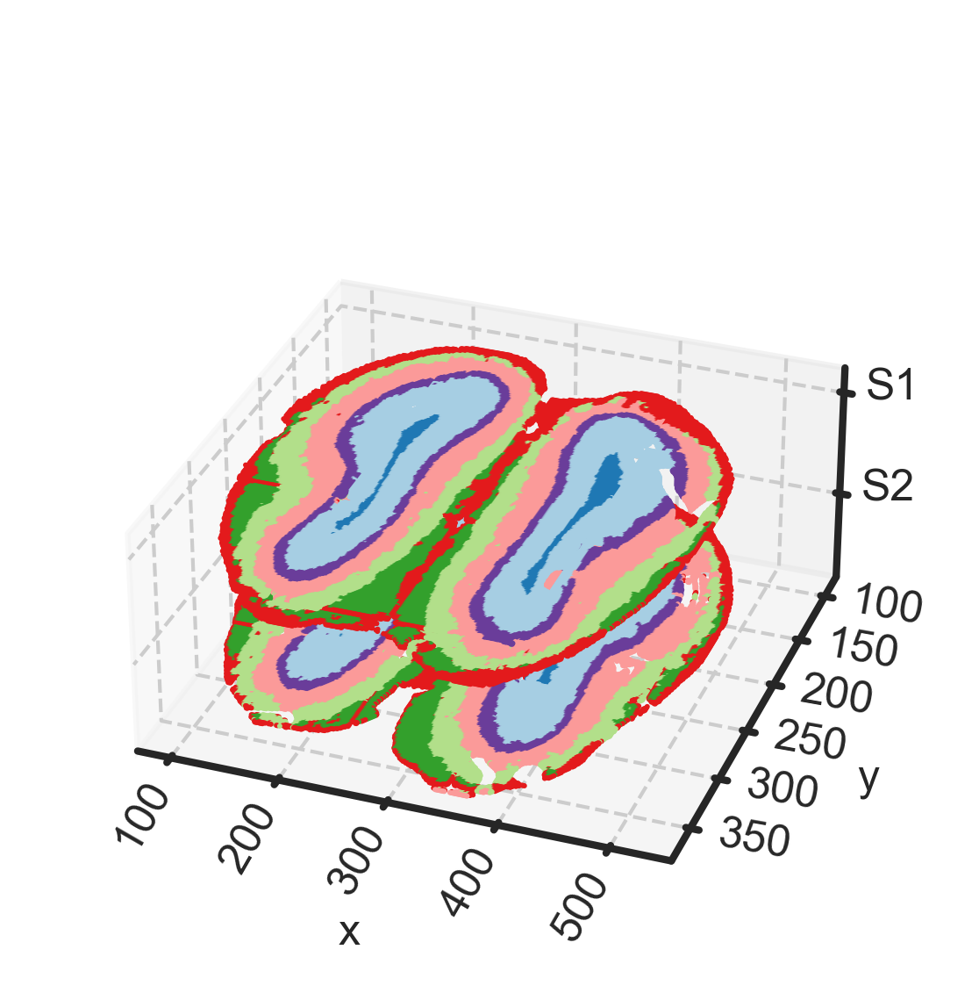

In [24]:
# https://jakevdp.github.io/PythonDataScienceHandbook/04.12-three-dimensional-plotting.html
from mpl_toolkits.mplot3d import Axes3D

sample_ids = ['Mouse_olfa_S1', 'Mouse_olfa_S2']
x_coor=[]
y_coor=[]
for _sample in sample_ids:
    _adata = adata[adata.obs['batch'] == _sample]
    x = _adata.obsm['spatial'][:,0]
    x = x-x.min() + 100
    x_coor.extend(x.tolist())
    
    y = _adata.obsm['spatial'][:,1]
    y = y-y.min() + 100
    y_coor.extend(y.tolist())
    
fig = plt.figure(figsize=(utils.centimeter*5.5, utils.centimeter*5.5))
ax = fig.add_subplot(projection='3d')

for axis in [ax.xaxis, ax.yaxis, ax.zaxis]:
    axis._axinfo["grid"]['linewidth'] = .5
    axis._axinfo["grid"]['linestyle'] = "--"
#     axis._axinfo['tick']['inward_factor'] =0.05
#     axis._axinfo['tick']['outward_factor'] =0.05
#     axis._axinfo['tick']['width'] = 0.25
    
# for axis in [ax.w_xaxis, ax.w_yaxis, ax.w_zaxis]:
#     axis.line.set_linewidth(0.8)
#     axis.line.set_color('grey')
x,y = x_coor,y_coor
# x,y = adata.obs['array_row'],adata.obs['array_col']
z = -adata.obs["batch"].cat.codes + 2
ax.scatter(x, y, z, c = colss, s=2, marker='.',alpha=1, rasterized=True, edgecolors='none')

# first 3 params are used to adjust scales of the three axes: x, y,z
ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), np.diag([1.,1.,0.6,1]))

ax.view_init(30,-70)

ax.set_zticks([1,2])
ax.set_zlim([0.2,2.2])
ax.set_zticklabels(['S2','S1'],ha='left',va='center')
ax.zaxis.set_tick_params(pad=-6)
# ax.set_zlabel('Mouse Olfa Section', labelpad=-12)

ax.set_xlim(ax.get_xlim()[0],ax.get_xlim()[1])
ax.set_ylim(ax.get_ylim()[1]-80,ax.get_ylim()[0])
ax.set_yticklabels(ax.get_yticklabels(), 
                verticalalignment='baseline',
                horizontalalignment='left')
ax.set_yticklabels(ax.get_yticklabels(),rotation=-10,ha='left',va='baseline', rotation_mode="anchor")
ax.yaxis.set_tick_params(pad=-5)
ax.set_ylabel('y',labelpad=-8)

ax.set_xticklabels(ax.get_xticklabels(),rotation=60,ha='right', va='center', rotation_mode="anchor")
ax.xaxis.set_tick_params(pad=-5)
ax.set_xlabel('x', labelpad=-6)

plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_olfa_3d.pdf"), bbox_inches='tight', format='pdf', dpi=400)

# Cell type fraction

In [16]:
domain_ct_cnt = adata.obs[['annotation', 'SpaSEG_clusters']].groupby(['SpaSEG_clusters','annotation']).size().unstack()
domain_ct_cnt_ = domain_ct_cnt.div(domain_ct_cnt.sum(axis=1), axis=0)

In [17]:
domain_ct_cnt_

annotation,Blood,Cavity,GCL-D,GCL-E,GCL-I,GL,IPL,ML,Meninges,ONL,OPL,SEZ
SpaSEG_clusters,,,,,,,,,,,,
0,0.011213,0.000820,0.236027,0.378402,0.217415,0.007571,0.001411,0.000229,0.001144,0.000267,0.006655,0.138847
1,0.001267,0.000905,0.032754,0.006515,0.027868,0.011582,0.000000,0.000181,0.005972,0.000905,0.017191,0.894861
2,0.001098,0.002031,0.000823,0.001455,0.000714,0.583610,0.014354,0.024508,0.027417,0.067925,0.273102,0.002964
3,0.000000,0.001942,0.000000,0.000000,0.000000,0.044671,0.000000,0.000000,0.058894,0.859470,0.033770,0.001253
4,0.001793,0.000928,0.002206,0.009503,0.002061,0.219064,0.046938,0.135186,0.021006,0.004865,0.551895,0.004556
5,0.000090,0.009122,0.000632,0.000813,0.001310,0.082867,0.000000,0.000542,0.289875,0.441158,0.167991,0.005600
6,0.006418,0.000193,0.070022,0.258421,0.056993,0.042274,0.491121,0.042853,0.001496,0.000000,0.021523,0.008686


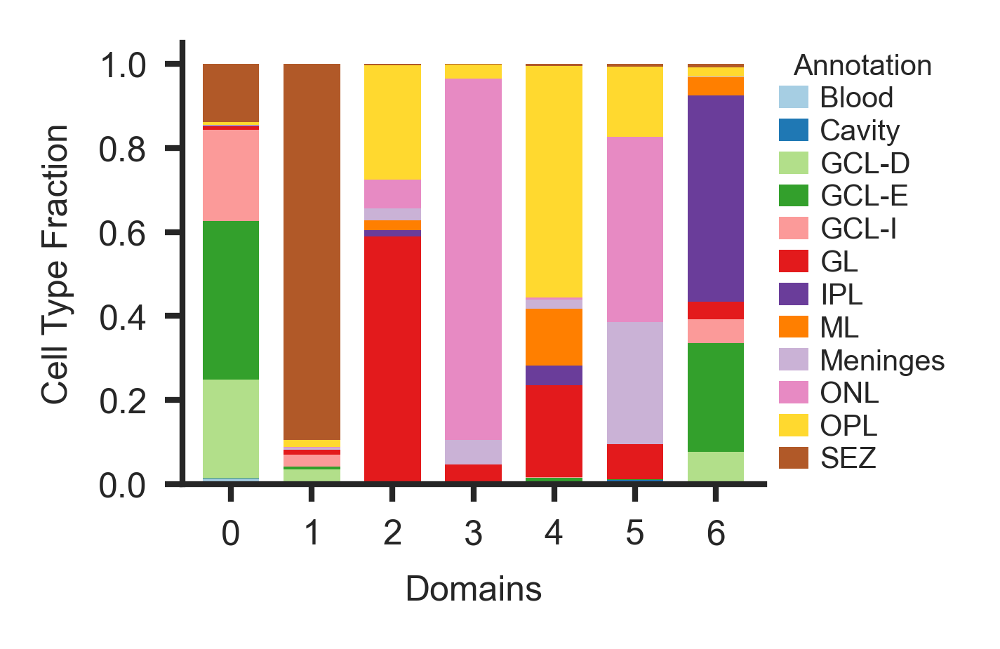

In [20]:
fig,ax = plt.subplots(figsize=(utils.centimeter*4.5, utils.centimeter*3.5)) 
domain_ct_cnt_.plot(kind='bar', stacked=True,ax=ax, color=cols,edgecolor=None, linewidth=0, width=0.7)
ax.tick_params(direction='out', length=3, pad=3, width=1)
leg = ax.legend(loc='center left', bbox_to_anchor=[0.98, 0.5], ncol=1, frameon=False, 
           markerscale=0.6, labelspacing=0.2, fontsize=5,
          handleheight= 0.8, handlelength=1,title='Annotation')
leg.get_title().set_fontsize('5')
sns.despine()
ax.set_xticklabels(ax.get_xticklabels(),rotation=0)
ax.set_xlabel('Domains')
ax.set_ylabel('Cell Type Fraction')
plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_olfa_celltypefraction.pdf"), bbox_inches='tight', format='pdf', dpi=300)

# Compare methods

In [16]:
# here we just compare
method_list=["SpaSEG","Harmony","liger"]
title_list=["SpaSEG",'Harmony','LIGER']
best_list=["SpaSEG_clusters","X_Harmony_leiden_0.83","H_liger_leiden_0.5"]

## Samples (Batch)

/home/baiyong/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/baiyong/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/baiyong/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


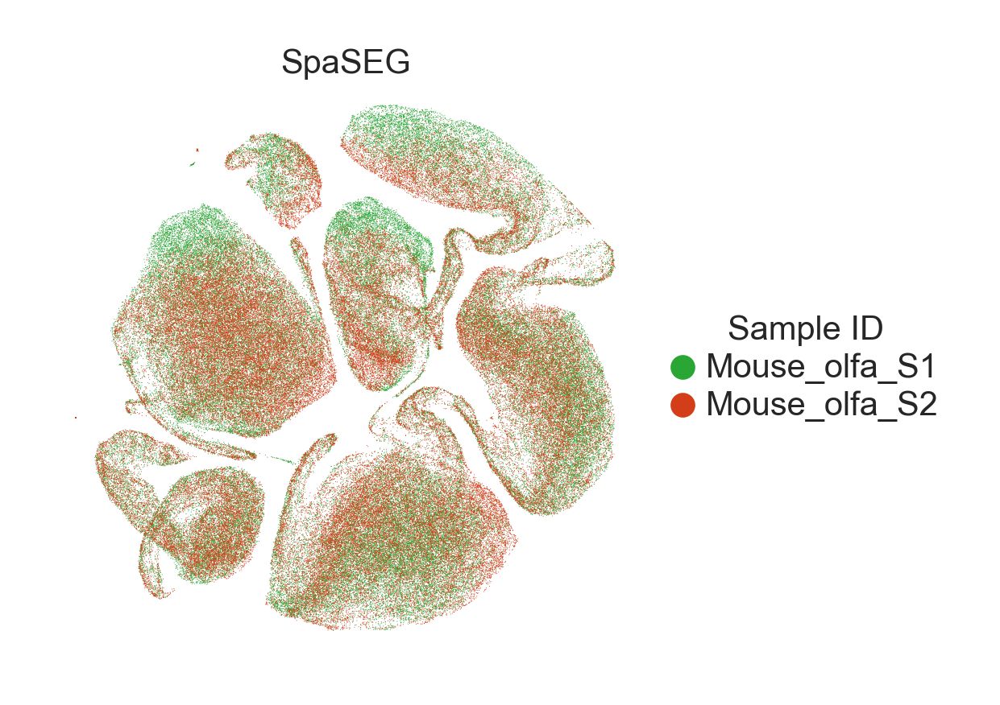

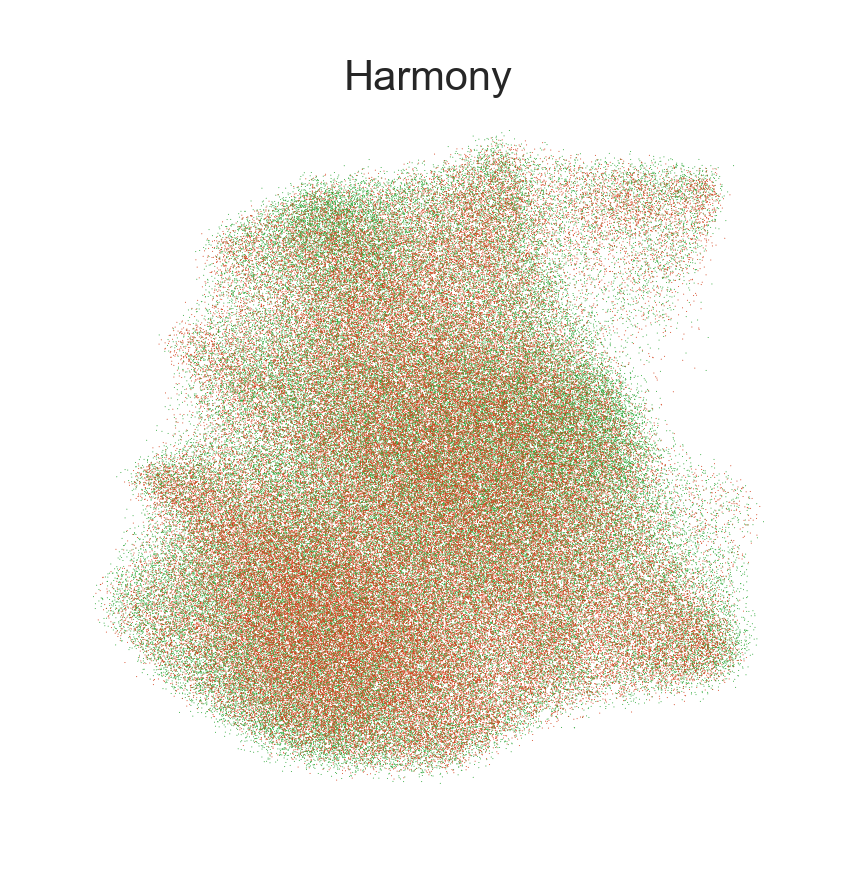

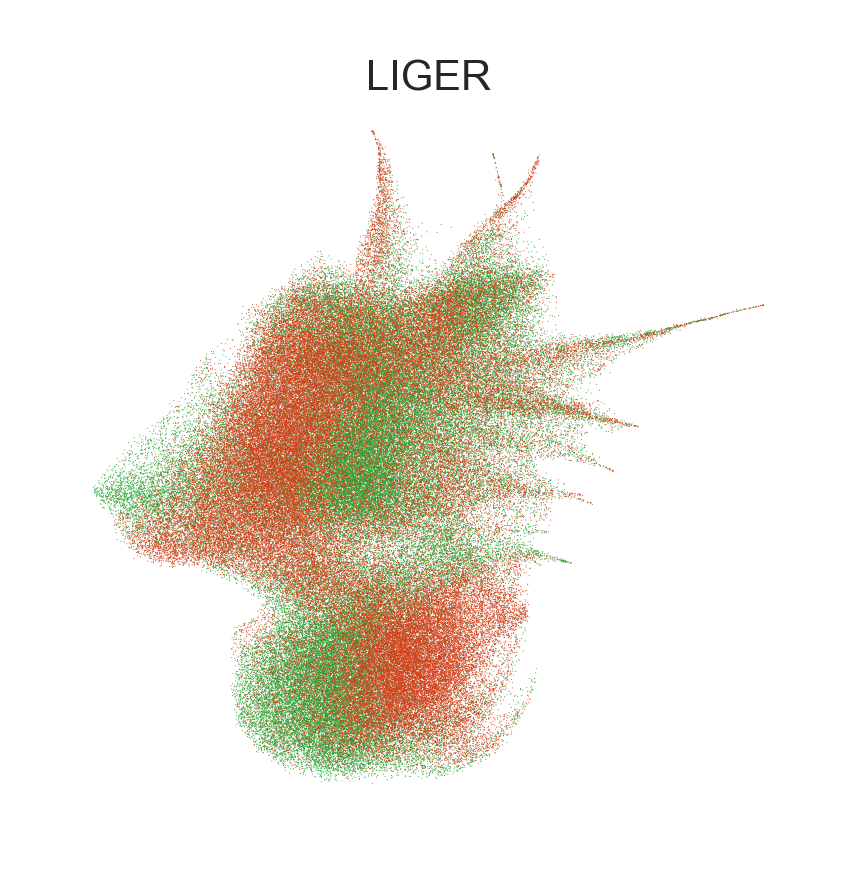

In [34]:
_palette_samples=dict(zip(sample_ids, [utils.react_cols_10[1],utils.react_cols_10[3]]))
for i,(method,title) in enumerate(zip(method_list,title_list)):
    fig,ax = plt.subplots(figsize=(utils.centimeter*4, utils.centimeter*4))
#     sc.tl.umap(adata, neighbors_key="neighbor_"+method)
#     sc.pl.umap(adata, ax=ax, color='batch', palette=_palette_samples,
#                           frameon=False,show=False,edgecolor='none',size=12000/len(adata.obs))
    sc.pl.embedding(adata, basis=f'X_umap_{method}',color='batch', palette=_palette_samples,neighbors_key=f"neighbor_{method}",ax=ax,
                          frameon=False,show=False,edgecolor='none',size=12000/len(adata.obs))
    ax.set_title(title,fontsize=5,pad=0)
    
    if i==0:
        leg = ax.legend(loc='center left', bbox_to_anchor=[1, 0.5], ncol=1, frameon=False, 
           markerscale=0.6, labelspacing=0.2, fontsize=5,
          handleheight= 0.8, handlelength=0.6,title='Sample ID')
        leg.get_title().set_fontsize('5')
    else:
        ax.get_legend().remove()
    plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_olfa_umap_batch_{title}.pdf"), bbox_inches='tight', format='pdf', dpi=300)

## True domain

/home/baiyong/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/baiyong/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/baiyong/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


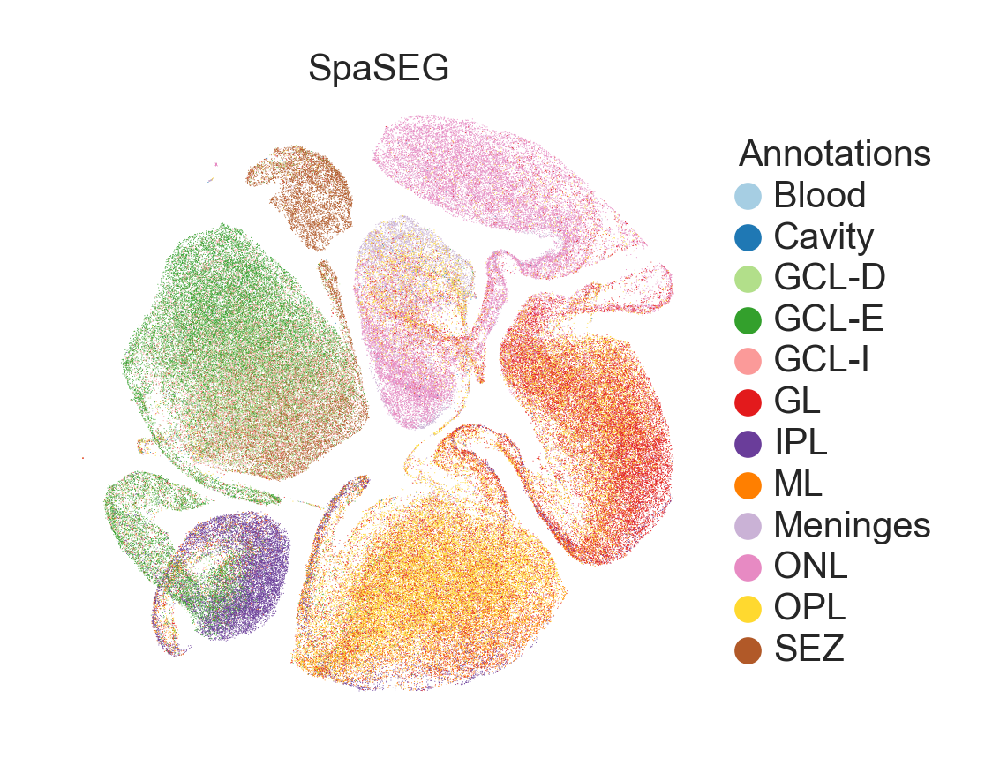

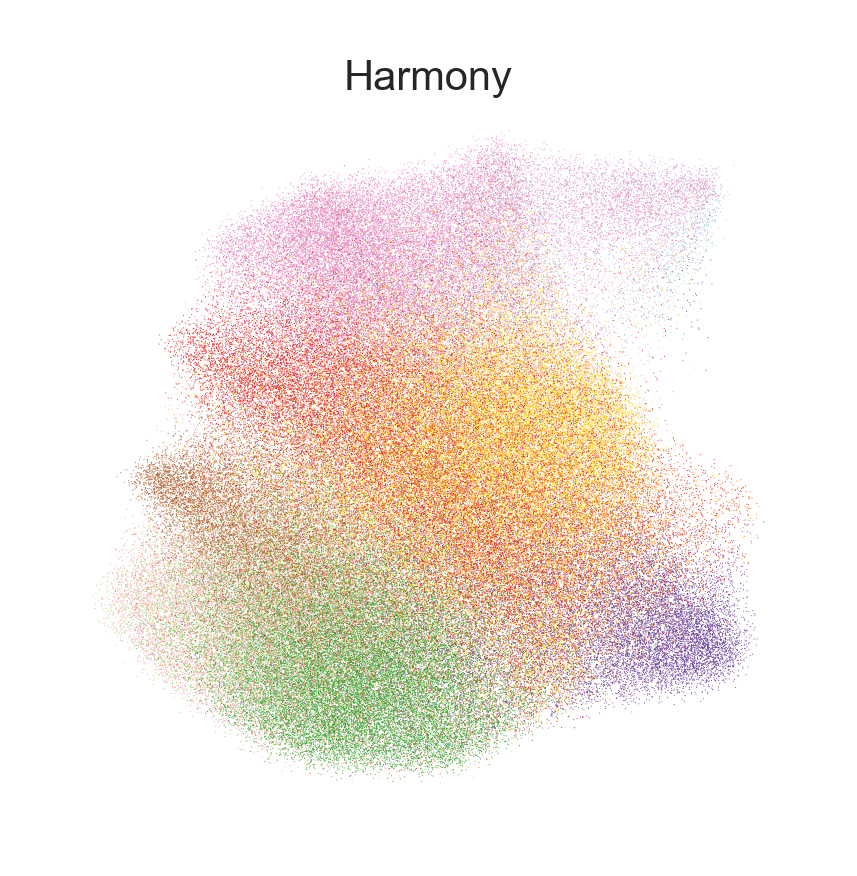

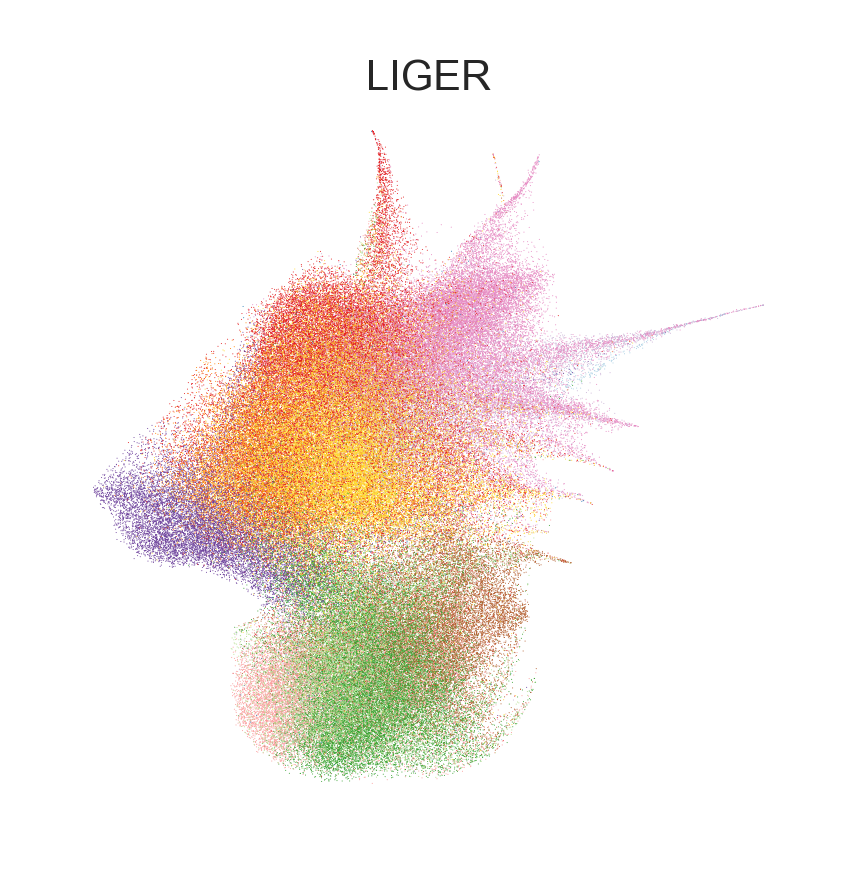

In [35]:
for i,(method,title) in enumerate(zip(method_list,title_list)):
    fig,ax = plt.subplots(figsize=(utils.centimeter*4, utils.centimeter*4))
    
    sc.pl.embedding(adata, basis=f'X_umap_{method}',color='annotation', palette=ground_col_palette,neighbors_key=f"neighbor_{method}",ax=ax,
                          frameon=False,show=False,edgecolor='none',size=12000/len(adata.obs))
    # ax_b.set_title('SpaSEG clusters', pad=0, fontsize=7)
    ax.set_title(title,fontsize=5,pad=0)
    
    if i==0:
        leg = ax.legend(loc='center left', bbox_to_anchor=[1, 0.5], ncol=1, frameon=False, 
           markerscale=0.6, labelspacing=0.2, fontsize=5,
          handleheight= 0.8, handlelength=0.6,title='Annotation')
        leg.get_title().set_fontsize('5')
    else:
        ax.get_legend().remove()
    plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_olfa_umap_celltype_{title}.pdf"), bbox_inches='tight', format='pdf', dpi=300)

/home/baiyong/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/baiyong/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/baiyong/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


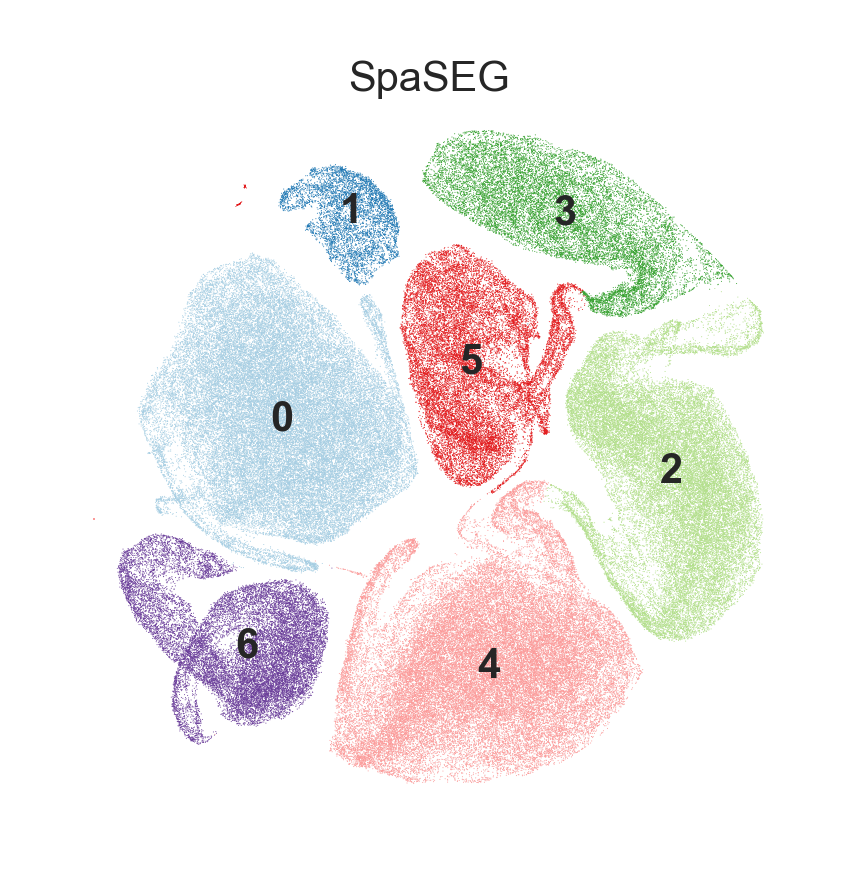

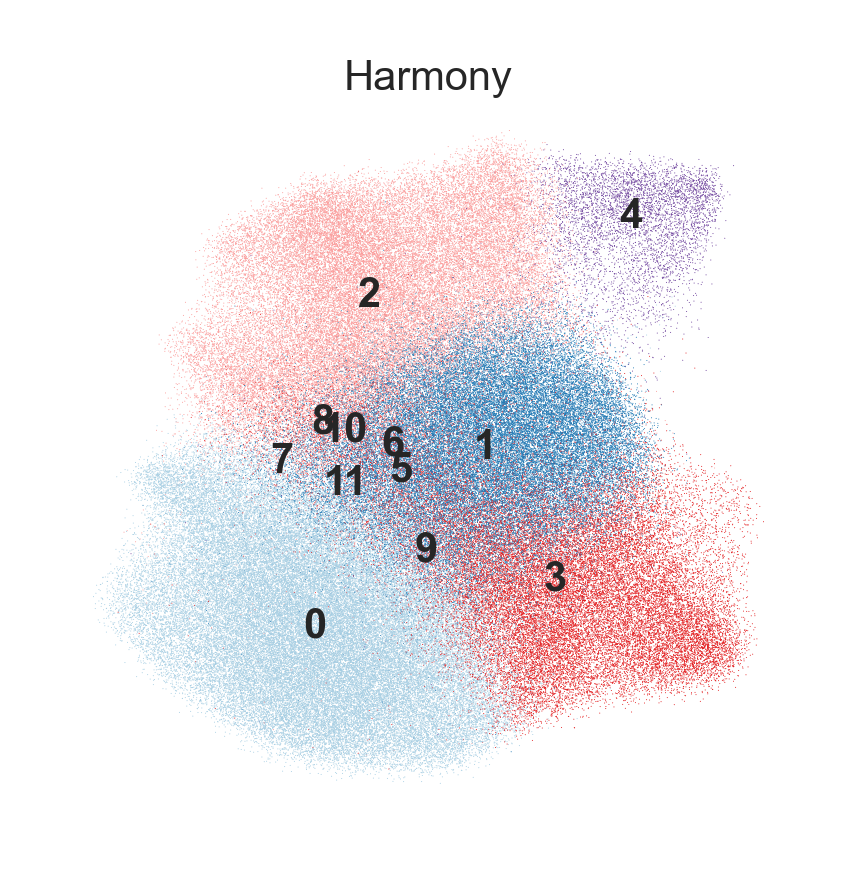

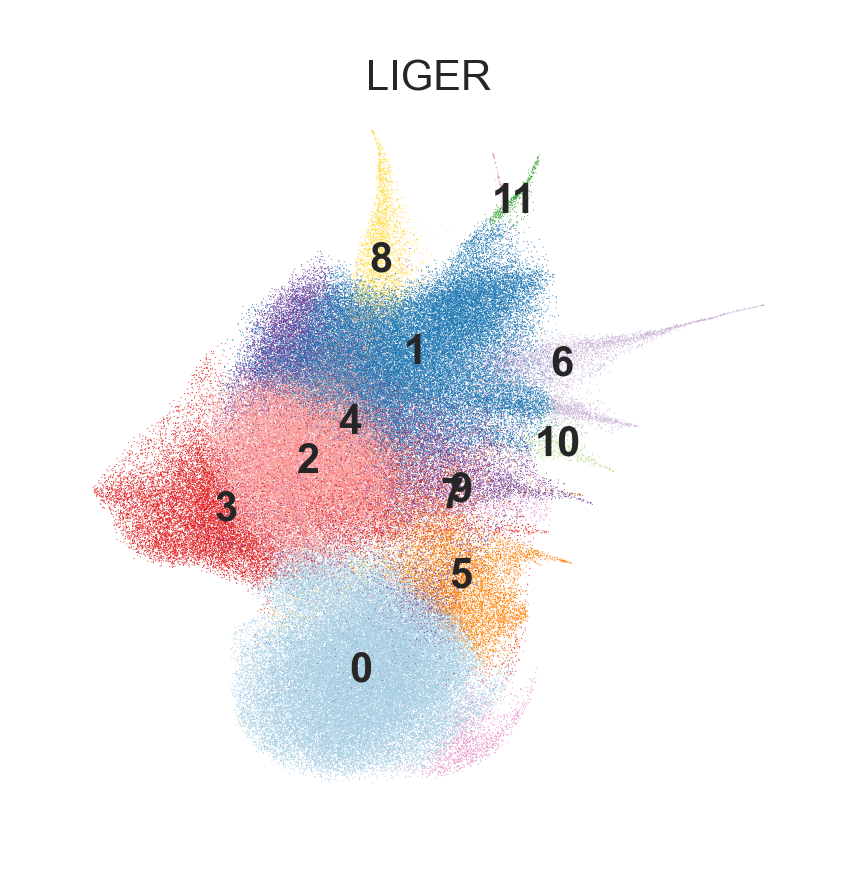

In [47]:
# method = 'SpaSEG'
# fig,ax = plt.subplots(figsize=(utils.centimeter*4, utils.centimeter*4))
# sc.pl.embedding(adata, basis=f'X_umap_{method}',color='SpaSEG_clusters', palette=ss_col_palette,neighbors_key=f"neighbor_{method}",ax=ax, legend_loc='on data',
#                           frameon=False,show=False,edgecolor='none',size=12000/len(adata.obs))
# ax.set_title('SpaSEG',fontsize=5,pad=0)

# plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Supp_baseline_umap_MO_SpaSEG_label.pdf"), bbox_inches='tight', format='pdf', dpi=300)

for i,(method,title) in enumerate(zip(method_list,title_list)):
    fig,ax = plt.subplots(figsize=(utils.centimeter*4, utils.centimeter*4))
    
    _palette = ss_col_palette
    if method != 'SpaSEG':
        _clusters = adata.obs[best_list[i]].values
        _label = np.sort(np.unique(_clusters))
        _palette = dict(zip(_label, cols[:len(_label)]))
    
    sc.pl.embedding(adata, basis=f'X_umap_{method}',color=best_list[i], palette=_palette,neighbors_key=f"neighbor_{method}",ax=ax, legend_loc='on data',
                          frameon=False,show=False,edgecolor='none',size=12000/len(adata.obs))
    # ax_b.set_title('SpaSEG clusters', pad=0, fontsize=7)
    ax.set_title(title,fontsize=5,pad=0)
    
    plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Supp_MO_umap_{title}_label.pdf"), bbox_inches='tight', format='pdf', dpi=300)


/home/baiyong/.local/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/baiyong/.local/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


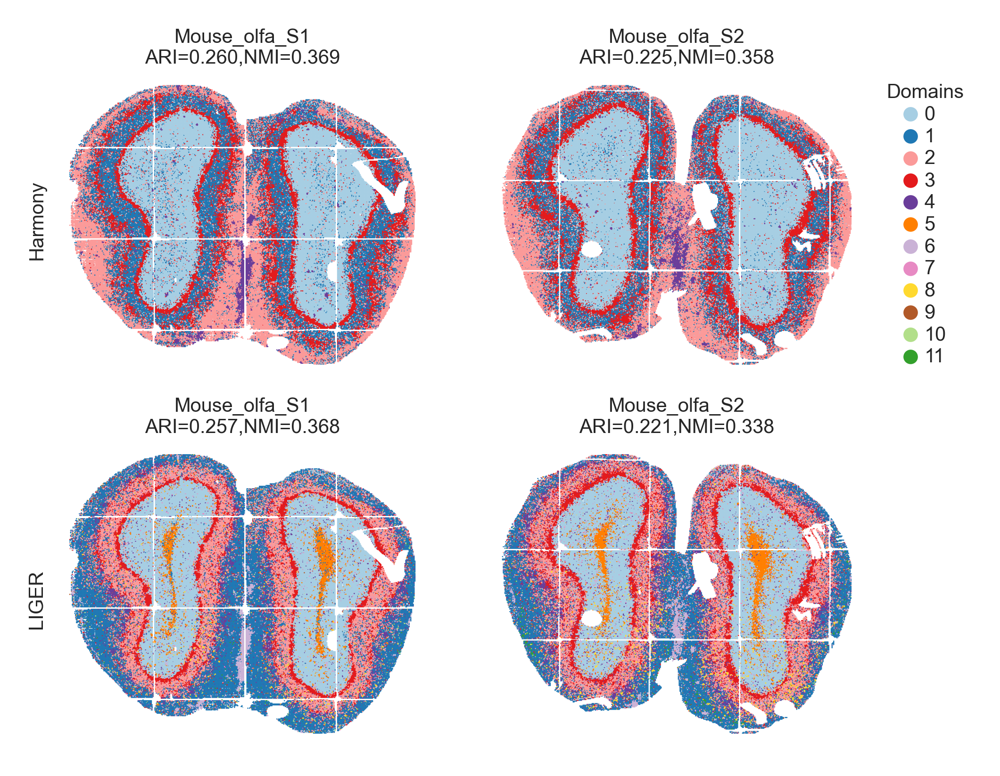

In [67]:
n_smaple = len(sample_ids)
n_algo = len(best_list[1:])
title_list=["SpaSEG",'Harmony','LIGER'][1:]
fig,axs = plt.subplots(n_algo, n_smaple, 
                       figsize=(utils.centimeter*10, utils.centimeter*4*n_smaple),
                      gridspec_kw={'wspace': 0, 'hspace':0.2})
for j, _sample in enumerate(sample_ids):
    _adata = adata[adata.obs['batch']==_sample]
    ground_truth = _adata.obs['annotation'].astype("category").cat.codes.values
    for i,_algo in enumerate(best_list[1:]): 
        _title= title_list[i]
        _clusters = _adata.obs[_algo].values
        ari = adjusted_rand_score(ground_truth,_clusters)
        nmi = normalized_mutual_info_score(ground_truth,_clusters)
        _label = np.sort(np.unique(_clusters))
        
        _palette = dict(zip(_label, cols[:len(_label)]))
        
        sc.pl.spatial(_adata, color=_algo, show=False, palette=_palette, ax=axs[i,j],spot_size =1.5, img_key=None, frameon=False)
        
        axs[i,j].set_title('{0}\nARI={1:.3f},NMI={2:.3f}'.format(_sample, ari,nmi),pad=2, y=1)
        if j==0:
            axs[i,j].text(_adata.obsm['spatial'][:,0].min()-50, _adata.obsm['spatial'][:,1].max()-130, f'{_title}',rotation='vertical')
        
        if j == n_smaple-1 and i == 0:
            leg = axs[i,j].legend(loc='center left', bbox_to_anchor=[1, 0.5], ncol=1, frameon=False, markerscale=0.6, labelspacing=0.2, fontsize=5,
                            handleheight= 0.8, handlelength=0.6,title='Domains')
            leg.get_title().set_fontsize('5')
        else:
            axs[i,j].get_legend().remove()
plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_olfa_spatial_HarmonyLiger.pdf"), bbox_inches='tight', format='pdf', dpi=300)

# Calculate Metrics

In [28]:
adata

AnnData object with n_obs × n_vars = 201740 × 23669
    obs: 'annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'array_row', 'array_col', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'batch', 'SpaSEG_discrete_clusters', 'SpaSEG_clusters', 'ground_truth_code', 'SpaSEG_batch_clusters', 'X_pca_leiden_0.5', 'X_Harmony_leiden_0.5', 'H_liger_leiden_0.5', 'X_pca_leiden_0.6', 'X_Harmony_leiden_0.6', 'H_liger_leiden_0.6', 'X_pca_leiden_0.7', 'X_Harmony_leiden_0.7', 'H_liger_leiden_0.7', 'X_pca_leiden_0.8', 'X_Harmony_leiden_0.8', 'H_liger_leiden_0.8', 'X_pca_leiden_0.9', 'X_Harmony_leiden_0.9', 'H_liger_leiden_0.9', 'X_Harmony_leiden_0.51', 'H_liger_leiden_0.51', 'X_Harmony_leiden_0.52', 'H_liger_leiden_0.52', 'X_Harmony_leiden_0.53', 'H_liger_leiden_0.53', 'X_Harmony_leiden_0.54', 'H_liger_leiden_0

## LISI

In [11]:
method_list=["SpaSEG_embedding","X_Harmony","H_liger"]
best_list=["SpaSEG_clusters","X_Harmony_leiden_0.83","H_liger_leiden_0.5"]

In [12]:
# LISI calculation code script, see _multisection_MO_lisi.py
f1_lisi_df = pd.read_csv(os.path.join(wk_root,"notebook/results/Multisection/MO_F1lisi.csv"))

In [14]:
f1_lisi_df.head()

,lisi_batch,lisi_domain,f1_lisi,method
0,1.744139,1.0,0.853303,SpaSEG_embedding
1,1.213891,1.0,0.352406,SpaSEG_embedding
2,1.548906,1.0,0.708766,SpaSEG_embedding
3,1.962604,1.0,0.980946,SpaSEG_embedding
4,1.600776,1.0,0.750606,SpaSEG_embedding


In [13]:
f1_lisi_df.groupby(['method']).agg(['min','max','mean','median','std'])

lisi_batch                                    lisi_domain  \
                        min  max      mean    median       std         min   
method                                                                       
H_liger            1.000000  2.0  1.484996  1.447456  0.327832         1.0   
SpaSEG_embedding   1.000000  2.0  1.705888  1.801075  0.284874         1.0   
X_Harmony          1.278041  2.0  1.908320  1.945905  0.101935         1.0   

                                                         f1_lisi       \
                       max      mean    median       std     min  max   
method                                                                  
H_liger           5.162549  1.425392  1.170242  0.543283     0.0  1.0   
SpaSEG_embedding  2.609856  1.001194  1.000000  0.025045     0.0  1.0   
X_Harmony         5.017835  2.243683  2.207823  0.800809     0.0  1.0   

                                                
                      mean    median       std  
method                                          
H_liger           0.556765  0.584885  0.297428  
SpaSEG_embedding  0.786154  0.888887  0.249766  
X_Harmony         0.746951  0.755013  0.147255

In [26]:
from statannotations.Annotator import Annotator
bg_f = ['#ffb482', '#8de5a1','#fab0e4' , '#d0bbff', '#debb9b', '#ff9f9b', '#cfcfcf', '#fffea3', '#b9f2f0']
ln_f = ['#ff7c00', '#1ac938','#f14cc1' , '#8b2be2', '#9f4800', '#e8000b', '#a3a3a3', '#ffc400', '#00d7ff']
def _boxplot(data, x, y, orders, ax, bg_f, ln_f,comp_pairs, showfliers=True):
    
    plot_param={
        'data':data,
        'x':x,
        'y':y,
        'order':orders
    }
    
    palette = dict(zip(orders, bg_f))
    
    print(palette)
    
    axa = sns.boxplot(**plot_param,
                          ax=ax, palette=palette,
                          showfliers=showfliers, 
                          flierprops={"marker": ".",'markersize': 1},
                          linewidth=0.8,
                          width=0.6,saturation=1,showcaps=False)
    
    for i,artist in enumerate(ax.patches): #In matplotlib 3.5 the boxes are stored in ax.patches instead of ax.artists.
        # Set the linecolor on the artist to the facecolor, and set the facecolor to None
        # col = artist.get_facecolor()
        # artist.set_edgecolor(col)
        # artist.set_facecolor('None')
        artist.set_edgecolor(ln_f[i])
    
        # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same colour as above
        if showfliers:
            off_sets = 4
        else:
            off_sets = 3
        for j in range(i*off_sets,i*off_sets+off_sets):
            line = axa.lines[j]
            # line.set_color(col)
            # line.set_mfc(col)
            # line.set_mec(col)

            line.set_color(ln_f[i])
            line.set_mfc(ln_f[i])
            line.set_mec(ln_f[i])
    annot = Annotator(axa, pairs=comp_pairs, **plot_param)
    annot.configure(test='Mann-Whitney', comparisons_correction="BH", text_format='star', 
                    line_width=0.5,fontsize=6,loc='inside',line_height=0.03, text_offset=0.5)
    annot.apply_and_annotate()
    
    xticklabels = axa.set_xticklabels(axa.get_xticklabels(),rotation=30, ha='right',rotation_mode="anchor")
    for i, xticklabel in enumerate(xticklabels):
        xticklabel.set_y(xticklabel.get_position()[1] +  0.01)
    axa.tick_params(direction='out', length=3, pad=3, width=1)
#     plt.grid(color='0.9',linewidth=0.5)
    sns.despine()
    plt.xlabel(None)
    plt.ylabel(None)

    return axa

{'SpaSEG_embedding': '#ffb482', 'X_Harmony': '#8de5a1', 'H_liger': '#fab0e4'}
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

SpaSEG_embedding vs. X_Harmony: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:0.000e+00 U_stat=2.629e+10
SpaSEG_embedding vs. H_liger: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:0.000e+00 U_stat=3.002e+10


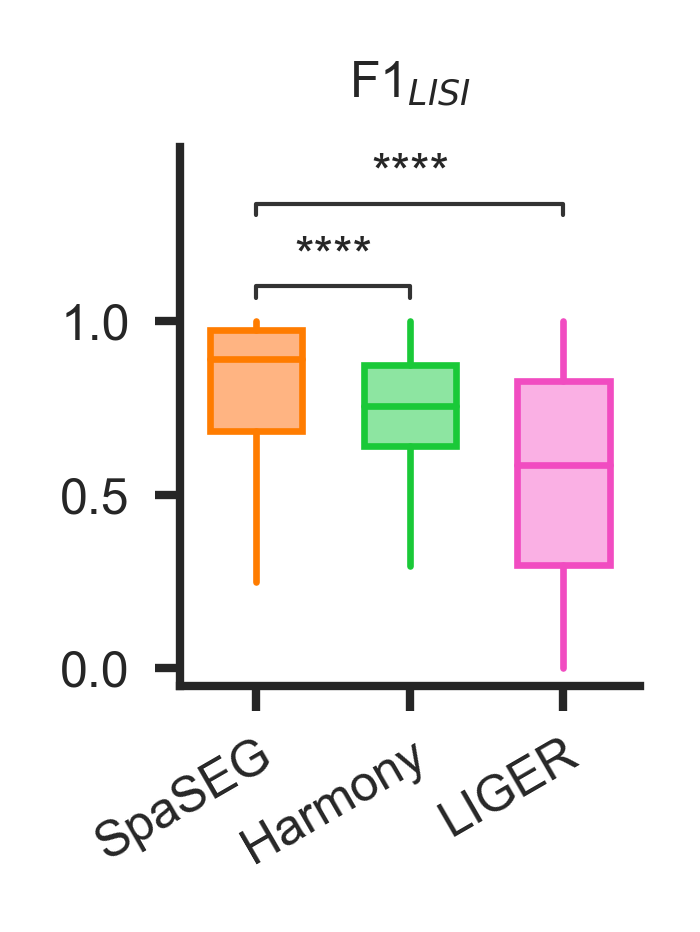

In [66]:
fig,ax = plt.subplots(figsize=(utils.centimeter*2.5, utils.centimeter*3))
axa=_boxplot(f1_lisi_df, 'method', 'f1_lisi', method_list, ax, 
             bg_f[:len(method_list)], ln_f[:len(method_list)],
             comp_pairs = [("SpaSEG_embedding","X_Harmony"),("SpaSEG_embedding","H_liger")],showfliers=False)
ax.set_xticklabels(["SpaSEG",'Harmony','LIGER'])
ax.set_title(r'F1$_{LISI}$')
plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_olfa_F1LISI.pdf"), bbox_inches='tight', format='pdf', dpi=400)

## Sihouette Score

In [16]:
method_list=["SpaSEG_embedding","X_Harmony","H_liger"]
best_list=["SpaSEG_clusters","X_Harmony_leiden_0.83","H_liger_leiden_0.5"]

In [17]:
# calculation code script, see _multisection_MO_scoef.py
df_asw=pd.read_csv(os.path.join(wk_root, f"notebook/results/Multisection/MO_F1asw.csv"))

In [18]:
df_asw

,asw_batch,asw_domain,method_use
0,-0.024105,0.684983,SpaSEG_embedding
1,-0.028118,0.948219,SpaSEG_embedding
2,0.011759,0.888010,SpaSEG_embedding
3,-0.002349,0.927346,SpaSEG_embedding
4,-0.002408,0.930879,SpaSEG_embedding
...,...,...,...
605215,0.086909,0.146900,H_liger
605216,0.088636,0.022020,H_liger
605217,-0.004385,-0.009081,H_liger
605218,0.072821,0.261803,H_liger


In [19]:
df_asw['asw_batch_norm'] = 1-(df_asw['asw_batch']+1)/2
df_asw['asw_domain_norm'] = (df_asw['asw_domain']+1)/2


In [20]:
df_asw['f1_asw'] = 2*df_asw['asw_batch_norm']*df_asw['asw_domain_norm']/(df_asw['asw_batch_norm']+df_asw['asw_domain_norm'])

In [21]:
df_asw

,asw_batch,asw_domain,method_use,asw_batch_norm,asw_domain_norm,f1_asw
0,-0.024105,0.684983,SpaSEG_embedding,0.512052,0.842492,0.636967
1,-0.028118,0.948219,SpaSEG_embedding,0.514059,0.974109,0.672975
2,0.011759,0.888010,SpaSEG_embedding,0.494120,0.944005,0.648695
3,-0.002349,0.927346,SpaSEG_embedding,0.501175,0.963673,0.659411
4,-0.002408,0.930879,SpaSEG_embedding,0.501204,0.965439,0.659850
...,...,...,...,...,...,...
605215,0.086909,0.146900,H_liger,0.456546,0.573450,0.508364
605216,0.088636,0.022020,H_liger,0.455682,0.511010,0.481763
605217,-0.004385,-0.009081,H_liger,0.502192,0.495459,0.498803
605218,0.072821,0.261803,H_liger,0.463590,0.630901,0.534457


In [24]:
df_asw[['method_use','f1_asw']].groupby(['method_use']).agg(['min','max','mean','median','std'])

f1_asw                                        
                       min       max      mean    median       std
method_use                                                        
H_liger           0.297672  0.640205  0.510147  0.510317  0.035435
SpaSEG_embedding  0.390547  0.675251  0.649187  0.650985  0.020263
X_Harmony         0.426895  0.564606  0.491328  0.491959  0.010644

{'SpaSEG_embedding': '#ffb482', 'X_Harmony': '#8de5a1', 'H_liger': '#fab0e4'}
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

SpaSEG_embedding vs. X_Harmony: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:0.000e+00 U_stat=4.067e+10
SpaSEG_embedding vs. H_liger: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:0.000e+00 U_stat=4.056e+10


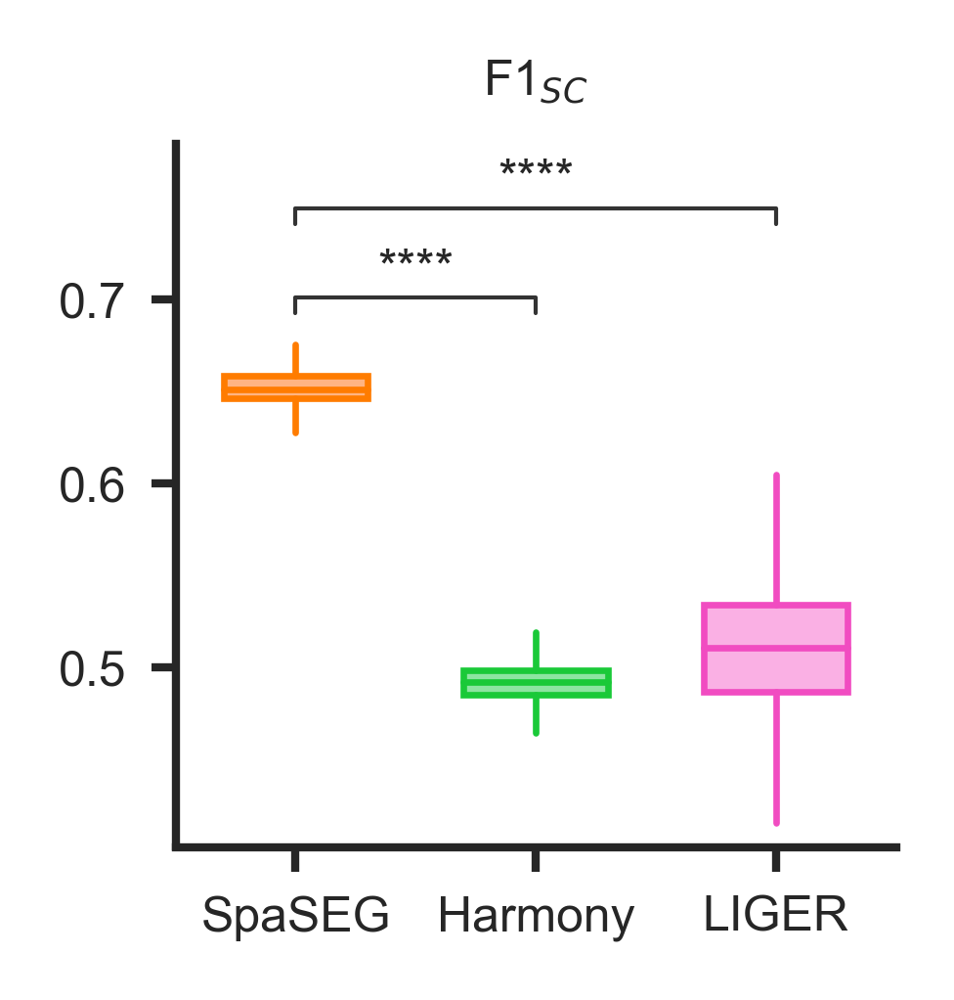

In [52]:
fig,ax = plt.subplots(figsize=(utils.centimeter*4, utils.centimeter*4))
axa=_boxplot(df_asw, 'method_use', 'f1_asw', method_list, ax, 
             bg_f[:len(method_list)], ln_f[:len(method_list)],
             comp_pairs = [("SpaSEG_embedding","X_Harmony"),("SpaSEG_embedding","H_liger")],showfliers=False)
ax.set_xticklabels(["SpaSEG",'Harmony','LIGER'])
ax.set_ylabel(r'F1$_{SC}$')
plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_olfa_F1ASW.pdf"), bbox_inches='tight', format='pdf', dpi=400)

# F1 ARI

In [27]:
method_list=["SpaSEG_embedding","X_Harmony","H_liger"]
title_list=["SpaSEG",'Harmony','LIGER']
best_list=["SpaSEG_clusters","X_Harmony_leiden_0.83","H_liger_leiden_0.5"]

In [55]:
def ari_batch_domain(adata, method_use='', percent_extract=0.8, batch_key='batch', domain_key='domain_cluster',n_iter=20):
    ari_b = []
    ari_d = []
    _len = len(adata.obs_names)
    for i in range(n_iter):
        idxx = np.random.permutation(_len)
        rand_cidx = adata.obs_names[idxx[:int(_len*percent_extract)]]
        adata_ext = adata[rand_cidx,:]
        
        ground_truth = adata_ext.obs['annotation'].astype("category").cat.codes.values
        _batch = adata_ext.obs[batch_key].astype("category").cat.codes.values
        _clusters = adata_ext.obs[domain_key].values
        
        ari_batch = adjusted_rand_score(_batch,_clusters)
        ari_domain = adjusted_rand_score(ground_truth,_clusters)
        
        ari_b.append(ari_batch)
        ari_d.append(ari_domain)
    
    df = pd.DataFrame({'ari_batch':ari_b, 'ari_domain': ari_d})
    df['method_use']=method_use
    return df

In [43]:
df_spaseg=ari_batch_domain(adata, method_use='SpaSEG_embedding', percent_extract=0.8, batch_key='batch', domain_key='SpaSEG_clusters',n_iter=100)
df_harmony=ari_batch_domain(adata, method_use='X_Harmony', percent_extract=0.8, batch_key='batch', domain_key='X_Harmony_leiden_0.83',n_iter=100)
df_liger=ari_batch_domain(adata, method_use='H_liger', percent_extract=0.8, batch_key='batch', domain_key='H_liger_leiden_0.5',n_iter=100)

In [44]:
df_spaseg['ari_batch_norm'] = 1-df_spaseg['ari_batch']
df_spaseg['ari_domain_norm'] = df_spaseg['ari_domain']

df_harmony['ari_batch_norm'] = 1-df_harmony['ari_batch']
df_harmony['ari_domain_norm'] = df_harmony['ari_domain']

df_liger['ari_batch_norm'] = 1-df_liger['ari_batch']
df_liger['ari_domain_norm'] = df_liger['ari_domain']

In [45]:
df_ari = pd.concat([df_spaseg, df_harmony,df_liger])
df_ari['f1_ari'] = 2*df_ari['ari_batch_norm']*df_ari['ari_domain_norm']/(df_ari['ari_batch_norm']+df_ari['ari_domain_norm'])
df_ari.to_csv(os.path.join(wk_root, f"notebook/results/Multisection/MO_F1ari.csv"), index=False)

In [25]:
df_ari=pd.read_csv(os.path.join(wk_root, f"notebook/results/Multisection/MO_F1ari.csv"))
df_ari

,ari_batch,ari_domain,method_use,ari_batch_norm,ari_domain_norm,f1_ari
0,0.000318,0.309476,SpaSEG_embedding,0.999682,0.309476,0.472636
1,0.000322,0.309306,SpaSEG_embedding,0.999678,0.309306,0.472437
2,0.000312,0.309387,SpaSEG_embedding,0.999688,0.309387,0.472533
3,0.000307,0.309577,SpaSEG_embedding,0.999693,0.309577,0.472755
4,0.000279,0.309367,SpaSEG_embedding,0.999721,0.309367,0.472513
...,...,...,...,...,...,...
295,0.003695,0.232656,H_liger,0.996305,0.232656,0.377223
296,0.003578,0.232713,H_liger,0.996422,0.232713,0.377306
297,0.003684,0.232952,H_liger,0.996316,0.232952,0.377613
298,0.003669,0.231964,H_liger,0.996331,0.231964,0.376315


In [26]:
df_ari[['method_use','f1_ari']].groupby(['method_use']).agg(['min','max','mean','median','std'])

f1_ari                                        
                       min       max      mean    median       std
method_use                                                        
H_liger           0.375644  0.378790  0.377048  0.377008  0.000652
SpaSEG_embedding  0.471076  0.474525  0.472913  0.472886  0.000564
X_Harmony         0.379293  0.382554  0.381041  0.381060  0.000734

{'SpaSEG_embedding': '#ffb482', 'X_Harmony': '#8de5a1', 'H_liger': '#fab0e4'}
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

SpaSEG_embedding vs. X_Harmony: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.562e-34 U_stat=1.000e+04
SpaSEG_embedding vs. H_liger: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.562e-34 U_stat=1.000e+04


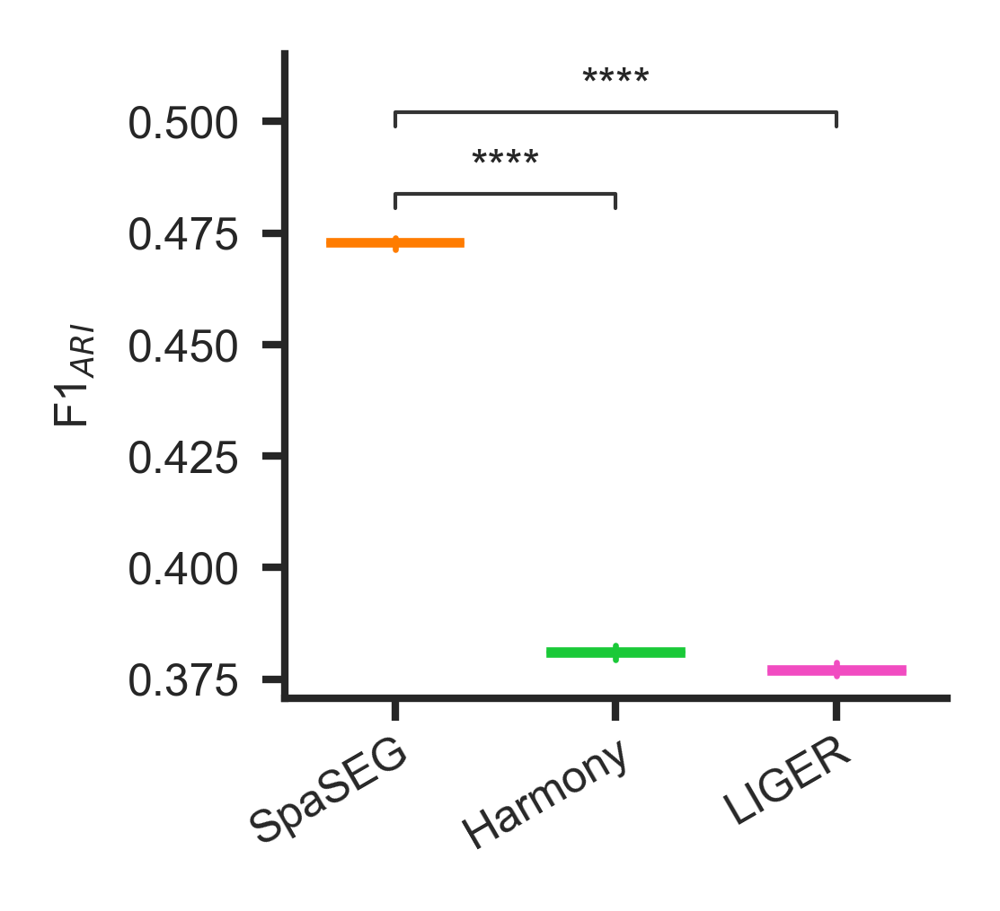

In [29]:
fig,ax = plt.subplots(figsize=(utils.centimeter*4, utils.centimeter*4))
axa=_boxplot(df_ari, 'method_use', 'f1_ari', method_list, ax, 
             bg_f[:len(method_list)], ln_f[:len(method_list)],
             comp_pairs = [("SpaSEG_embedding","X_Harmony"),("SpaSEG_embedding","H_liger")],showfliers=False)
ax.set_xticklabels(["SpaSEG",'Harmony','LIGER'])
ax.set_ylabel(r'F1$_{ARI}$')
xticklabels = axa.set_xticklabels(axa.get_xticklabels(),rotation=30, ha='right',rotation_mode="anchor")
for i, xticklabel in enumerate(xticklabels):
    xticklabel.set_y(xticklabel.get_position()[1] +  0.01)
plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Supp_MO_F1ARI.pdf"), bbox_inches='tight', format='pdf', dpi=300)

# All Sample ARI and NMI

In [33]:
def _ari_nmi(sample_ids, adata, best_list, method_list):
    
    _df = None
    
    for i, _sample_id in enumerate(sample_ids):
        _adata = adata[adata.obs['batch']==_sample_id]
        ground_truth = _adata.obs['annotation'].astype("category").cat.codes.values
        
        ari = []
        nmi = []
        method = []
        for _label,_method in zip(best_list,method_list):
            _clusters = _adata.obs[_label].values
            
            _ari = adjusted_rand_score(ground_truth,_clusters)
            _nmi = normalized_mutual_info_score(ground_truth,_clusters)
            
            ari.append(_ari)
            nmi.append(_nmi)
            method.append(_method)
            
        _df_tmp = pd.DataFrame({
            'sample_id':[_sample_id] * len(best_list),
            'ARI':ari,
            'NMI':nmi,
            'method':method
        })
        if i == 0:
            _df = _df_tmp
        else:
            _df = pd.concat([_df, _df_tmp], axis=0)
            
    return _df

In [34]:
sample_ids = ['Mouse_olfa_S1', 'Mouse_olfa_S2']
title_list=["SpaSEG",'Harmony','LIGER']
best_list=["SpaSEG_clusters","X_Harmony_leiden_0.83","H_liger_leiden_0.5"]

df = _ari_nmi(sample_ids, adata, best_list, title_list)

In [35]:
df

,sample_id,ARI,NMI,method
0,Mouse_olfa_S1,0.378343,0.507645,SpaSEG
1,Mouse_olfa_S1,0.259972,0.368769,Harmony
2,Mouse_olfa_S1,0.256719,0.367727,LIGER
0,Mouse_olfa_S2,0.276828,0.460552,SpaSEG
1,Mouse_olfa_S2,0.224908,0.357923,Harmony
2,Mouse_olfa_S2,0.221079,0.338201,LIGER


In [36]:
df[['method', 'ARI', 'NMI']].groupby('method').agg(['min','max','mean','median','std'])

ARI                                               NMI            \
              min       max      mean    median       std       min       max   
method                                                                          
Harmony  0.224908  0.259972  0.242440  0.242440  0.024794  0.357923  0.368769   
LIGER    0.221079  0.256719  0.238899  0.238899  0.025201  0.338201  0.367727   
SpaSEG   0.276828  0.378343  0.327586  0.327586  0.071782  0.460552  0.507645   

                                       
             mean    median       std  
method                                 
Harmony  0.363346  0.363346  0.007670  
LIGER    0.352964  0.352964  0.020878  
SpaSEG   0.484099  0.484099  0.033300

In [37]:

bg_f = ['#ffb482', '#8de5a1','#fab0e4' , '#d0bbff', '#debb9b', '#ff9f9b', '#cfcfcf', '#fffea3', '#b9f2f0']
ln_f = ['#ff7c00', '#1ac938','#f14cc1' , '#8b2be2', '#9f4800', '#e8000b', '#a3a3a3', '#ffc400', '#00d7ff']


In [38]:
sns.__version__

'0.11.0'

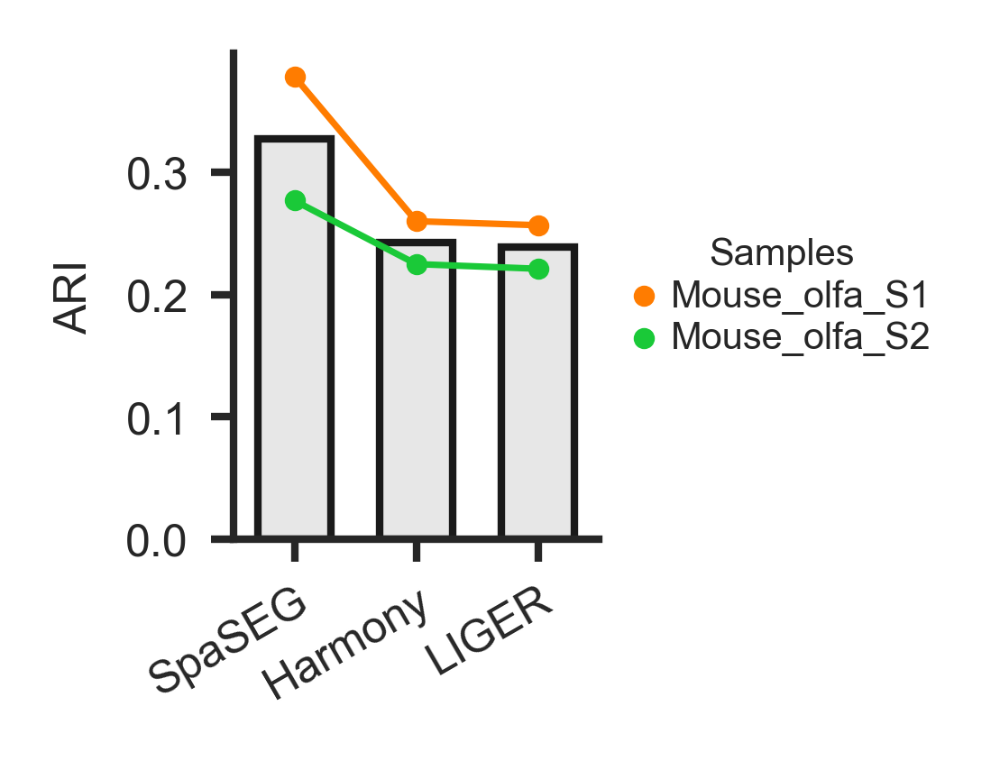

In [60]:
fig,ax = plt.subplots(figsize=(utils.centimeter*2.2, utils.centimeter*3))
sns.barplot(data=df, x="method", y="ARI", facecolor=(0.1, 0.1, 0.1, 0.1), edgecolor='k', linewidth=1,ci=None, ax=ax)
_palette=dict(zip(sample_ids, ln_f[:len(sample_ids)]))
# sns.stripplot(data=df, x="method", y="ARI", palette=_palette, ax=ax,size=3)
sns.pointplot(data=df, x="method", y="ARI",ax=ax,hue='sample_id', ci=None, scale=0.4, palette=_palette)

def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(ax, .6)

ax.set_xticklabels(["SpaSEG",'Harmony','LIGER'])
ax.set_ylabel('ARI')
ax.set_xlabel(None)
ax.tick_params(direction='out', length=3, pad=3, width=1)
xticklabels = ax.set_xticklabels(ax.get_xticklabels(),rotation=30, ha='right',rotation_mode="anchor")
for i, xticklabel in enumerate(xticklabels):
    xticklabel.set_y(xticklabel.get_position()[1] +  0.01)
    
sns.despine()
leg = ax.legend(loc='center left', bbox_to_anchor=[1, 0.5], ncol=1, frameon=False, markerscale=1, labelspacing=0.2, fontsize=5,
                            handleheight= 0.8, handlelength=0.6,title='Samples')
leg.get_title().set_fontsize('5')


plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Supp_MO_All_ARI.pdf"), bbox_inches='tight', format='pdf', dpi=400)

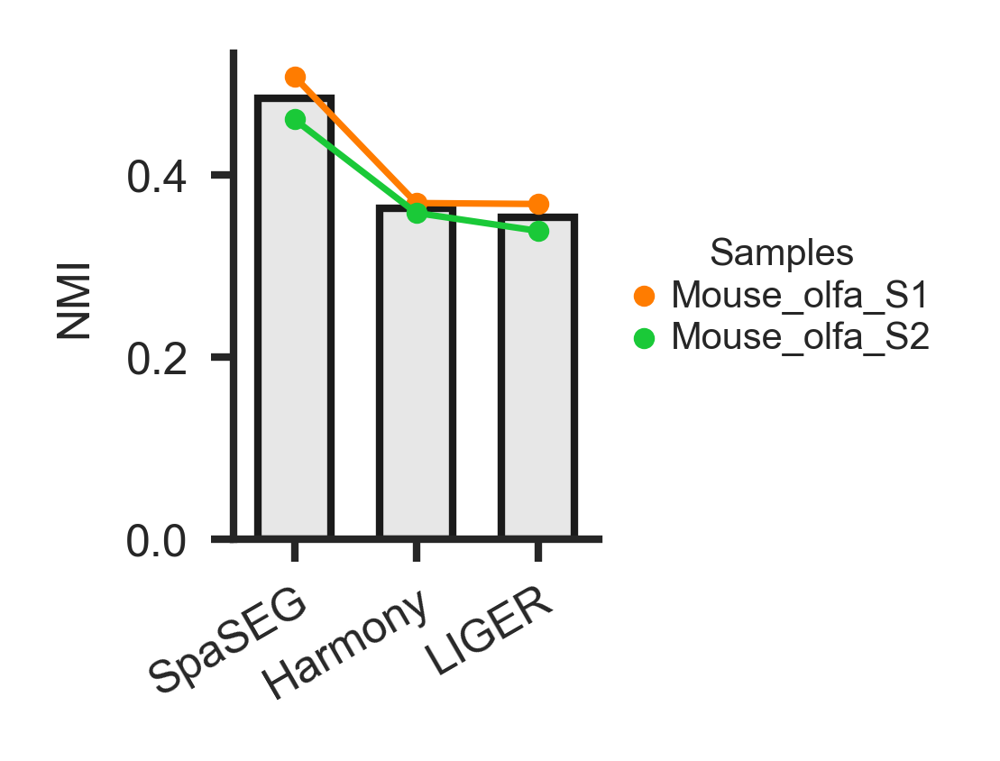

In [62]:
fig,ax = plt.subplots(figsize=(utils.centimeter*2.2, utils.centimeter*3))
sns.barplot(data=df, x="method", y="NMI", facecolor=(0.1, 0.1, 0.1, 0.1), edgecolor='k', linewidth=1,ci=None, ax=ax)

_palette=dict(zip(sample_ids, ln_f[:len(sample_ids)]))
# sns.stripplot(data=df, x="method", y="ARI", palette=_palette, ax=ax,size=3)
sns.pointplot(data=df, x="method", y="NMI",ax=ax,hue='sample_id', ci=None, scale=0.4, palette=_palette)

def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

change_width(ax, .6)

ax.set_xticklabels(["SpaSEG",'Harmony','LIGER'])
ax.set_ylabel('NMI')
ax.set_xlabel(None)
ax.tick_params(direction='out', length=3, pad=3, width=1)

xticklabels = ax.set_xticklabels(ax.get_xticklabels(),rotation=30, ha='right',rotation_mode="anchor")
for i, xticklabel in enumerate(xticklabels):
    xticklabel.set_y(xticklabel.get_position()[1] +  0.01)

sns.despine()

leg = ax.legend(loc='center left', bbox_to_anchor=[1, 0.5], ncol=1, frameon=False, markerscale=1, labelspacing=0.2, fontsize=5,
                            handleheight= 0.8, handlelength=0.6,title='Samples')
leg.get_title().set_fontsize('5')

plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Supp_MO_All_NMI.pdf"), bbox_inches='tight', format='pdf', dpi=400)